In [ ]:
import csv
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('lr_transformed_cea_data.csv')
df.head()

,id_pat,date,activity,timeline,Acc_x,Acc_y,Acc_z,Gyro_x,Gyro_y,Gyro_z,appui_leve,foot_type
0,P01,2019-05-07,2minBassin,0.000000,2.50,-9.38,0.25,-0.025089,-0.001091,0.021817,0.0,0.0
1,P01,2019-05-07,2minBassin,0.025575,2.43,-9.51,0.34,-0.013090,-0.021817,0.005454,0.0,0.0
2,P01,2019-05-07,2minBassin,0.051151,2.15,-9.62,0.51,-0.001091,-0.018544,0.007636,0.0,0.0
3,P01,2019-05-07,2minBassin,0.076726,2.20,-9.63,0.62,-0.014181,0.011999,-0.003272,0.0,0.0
4,P01,2019-05-07,2minBassin,0.102302,2.20,-9.51,0.93,-0.085085,0.078540,-0.041452,0.0,0.0


In [ ]:
df.isna().sum()

id_pat        0
date          0
activity      0
timeline      0
Acc_x         0
Acc_y         0
Acc_z         0
Gyro_x        0
Gyro_y        0
Gyro_z        0
appui_leve    1
foot_type     1
dtype: int64

In [ ]:
df['date'] = pd.to_datetime(df['date'])
df_05_07 = df[(df['date'] == '2019-05-07') & (df.id_pat == 'P01') & (df.activity == '2minBassin')]

In [ ]:
df[(df.id_pat == 'P02') & (df.activity == '2minBassin')].head()

,id_pat,date,activity,timeline,Acc_x,Acc_y,Acc_z,Gyro_x,Gyro_y,Gyro_z,appui_leve,foot_type


In [ ]:
df_05_07.shape

(6194, 12)

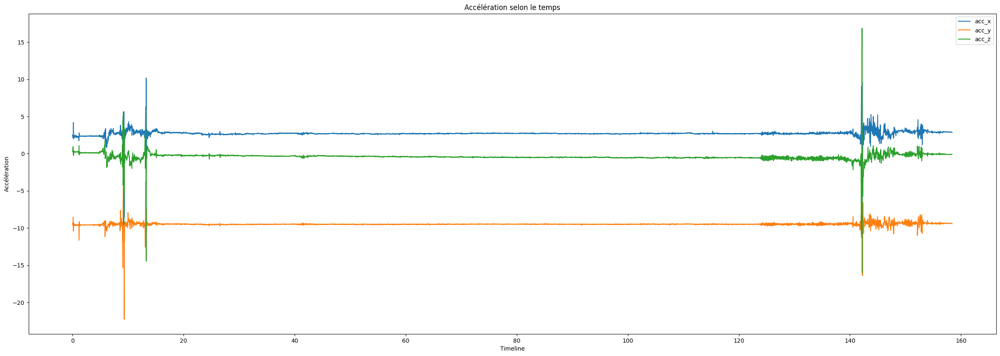

In [ ]:
X =  df_05_07['timeline']
Y_acc_x = df_05_07['Acc_x']
Y_acc_y = df_05_07['Acc_y']
Y_acc_z = df_05_07['Acc_z']
plt.figure(figsize=(30,10))
plt.plot(X,Y_acc_x, label='acc_x')
plt.plot(X,Y_acc_y, label='acc_y')
plt.plot(X,Y_acc_z, label='acc_z')
plt.xlabel('Timeline')
plt.ylabel('Accélération')
plt.title('Accélération selon le temps')
plt.legend()
plt.show()

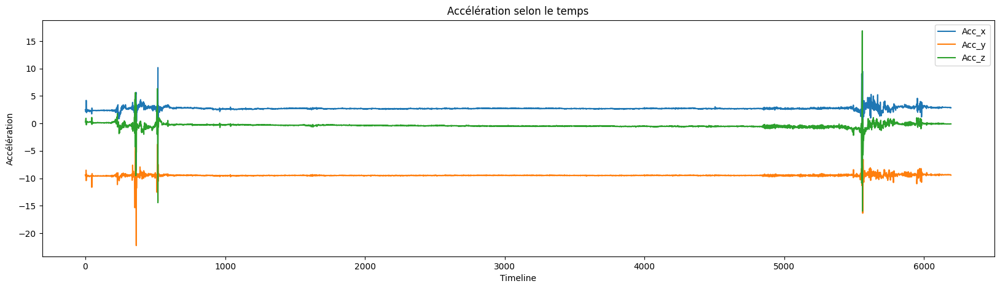

In [ ]:
df_05_07[['Acc_x', 'Acc_y', 'Acc_z']].plot(figsize=(20,5))
plt.xlabel('Timeline')
plt.ylabel('Acceleration')
plt.title('Acceleration in time')
plt.legend()
plt.show()

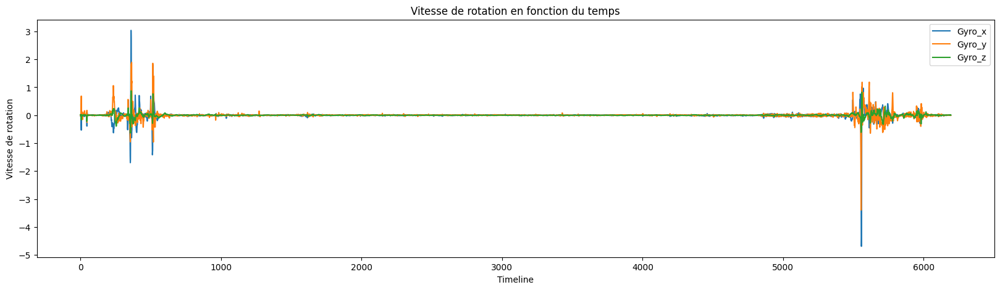

In [ ]:
df_05_07[['Gyro_x', 'Gyro_y', 'Gyro_z']].plot(figsize=(20,5))
plt.xlabel('Timeline')
plt.ylabel('Angular velocity')
plt.title('Vitesse de rotation en fonction du temps')
plt.legend()
plt.show()

In [ ]:
activities = df['activity'].unique()
activities

array(['2minBassin', '6min', 'EqSur1Pied', 'GetUpAndGo', 'Step',
       '1minJoint', 'Cuisine'], dtype=object)

In [ ]:
df['id_pat'].nunique()

8

In [ ]:
df.groupby(['id_pat', 'activity'])['timeline'].agg('max')/df.groupby(['id_pat', 'activity'])['timeline'].agg('count')

id_pat  activity  
P01     2minBassin    0.025571
        6min          0.025379
        EqSur1Pied    0.025697
        GetUpAndGo    0.025549
Name: timeline, dtype: float64

In [ ]:
df.groupby(['activity','id_pat'])['Acc_x'].agg(['mean','max','std','min','median']).T #T for transpose

activity,2minBassin,6min,EqSur1Pied,GetUpAndGo
id_pat,P01,P01,P01,P01
mean,2.716361,3.330061,2.482090,2.194129
max,10.170000,17.210000,25.060000,6.460000
std,0.357385,1.245012,1.351732,0.667437
min,-8.610000,-18.290000,-9.250000,-1.780000
median,2.700000,3.470000,2.630000,2.020000


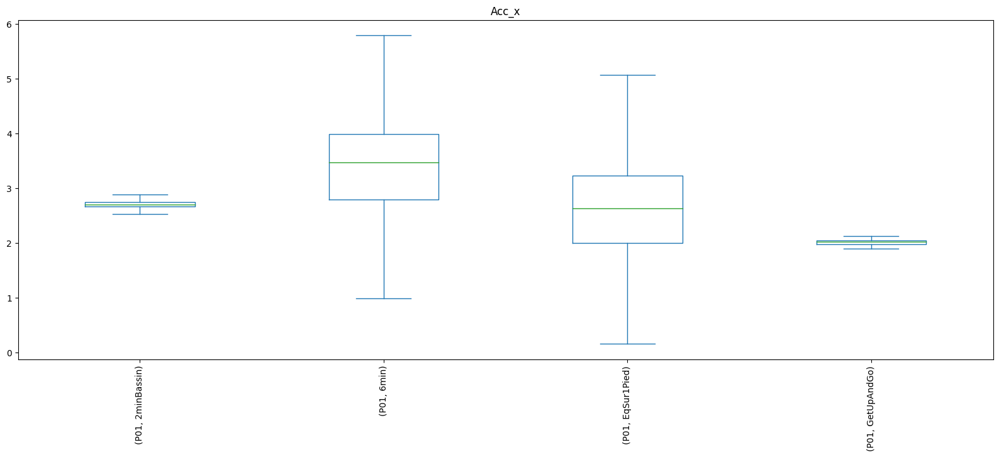

In [ ]:
df.plot.box(column=["Acc_x"], by=['id_pat','activity'], figsize=(20,7), showfliers=False)
plt.xticks(rotation='vertical')
plt.show()

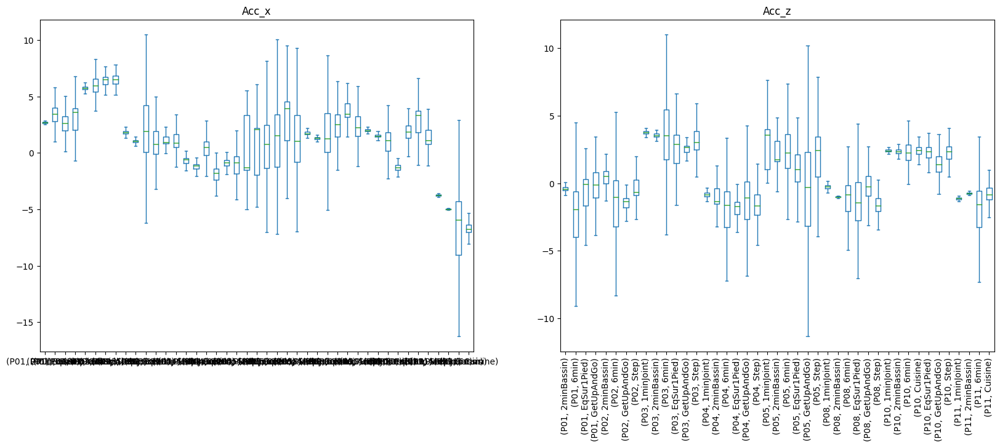

In [ ]:
df.plot.box(column=["Acc_x", "Acc_z"], by=['id_pat','activity'], figsize=(20,7), showfliers=False)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
df['Acc_x']

0        2.50
1        2.43
2        2.15
3        2.20
4        2.20
         ... 
25188    3.74
25189    3.83
25190    3.77
25191    4.10
25192    4.20
Name: Acc_x, Length: 25193, dtype: float64

In [ ]:
df['Acc_y']

0        -9.38
1        -9.51
2        -9.62
3        -9.63
4        -9.51
         ...  
25188    -8.91
25189    -9.18
25190    -9.96
25191   -10.85
25192   -10.68
Name: Acc_y, Length: 25193, dtype: float64

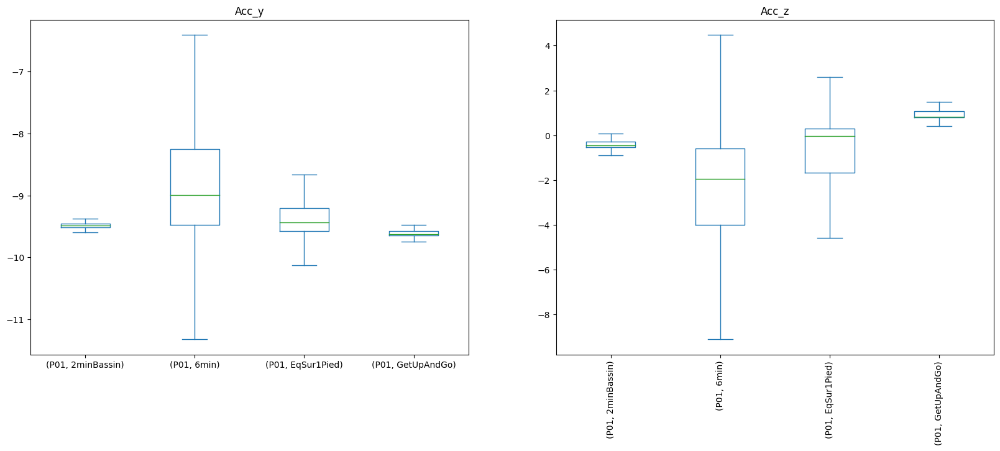

In [ ]:
df.plot.box(column=["Acc_y", "Acc_z"], by=['id_pat','activity'], figsize=(20,7), showfliers=False)
plt.xticks(rotation='vertical')
plt.show()

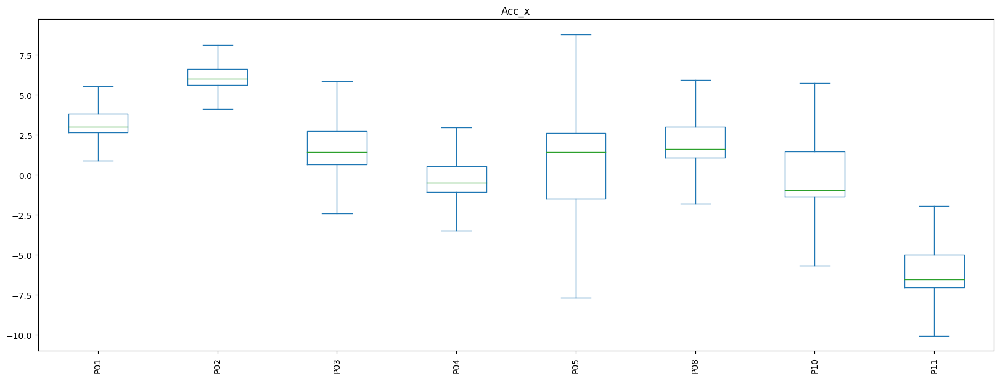

In [ ]:
df.plot.box(column="Acc_x", by='id_pat', figsize=(20,7), showfliers=False)
plt.xticks(rotation='vertical')
plt.show()

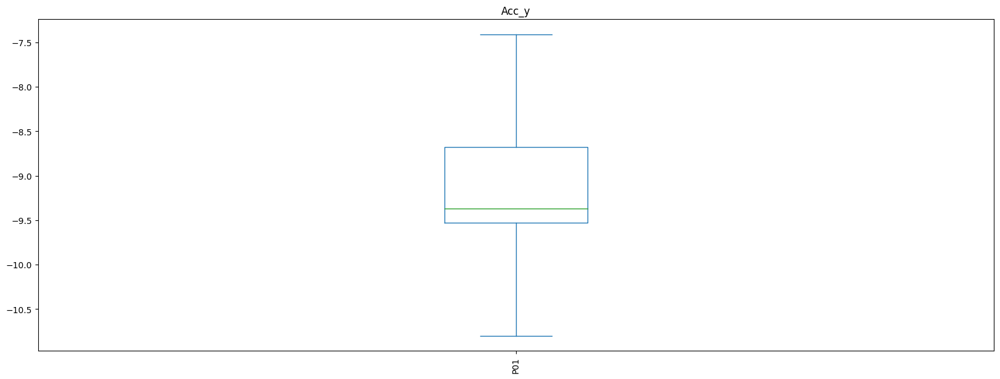

In [ ]:
df.plot.box(column="Acc_y", by='id_pat', figsize=(20,7), showfliers=False)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
fig = px.box(df,x = "id_pat",y="Acc_x")
fig.show()

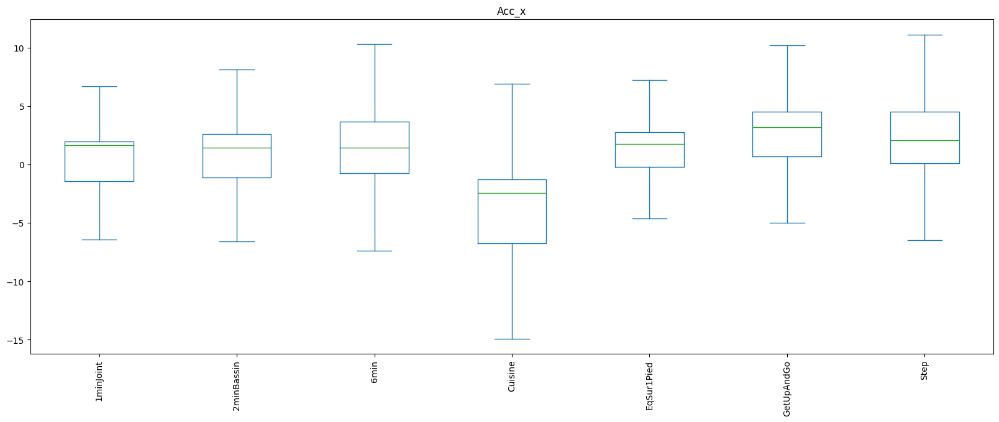

In [ ]:
df.plot.box(column="Acc_x", by='activity', figsize=(20,7), showfliers=False)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
fig = px.box(df,x = "activity",y="Acc_x")
fig.show()

<Axes: xlabel='id_pat'>

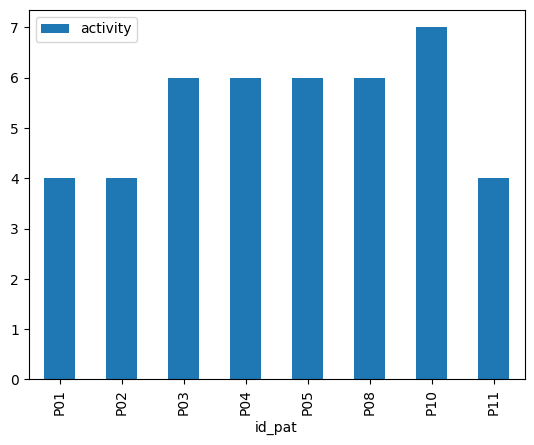

In [ ]:
pd.DataFrame(df.groupby('id_pat')['activity'].nunique()).plot.bar() #nb d'act faite par pat

<Axes: xlabel='activity'>

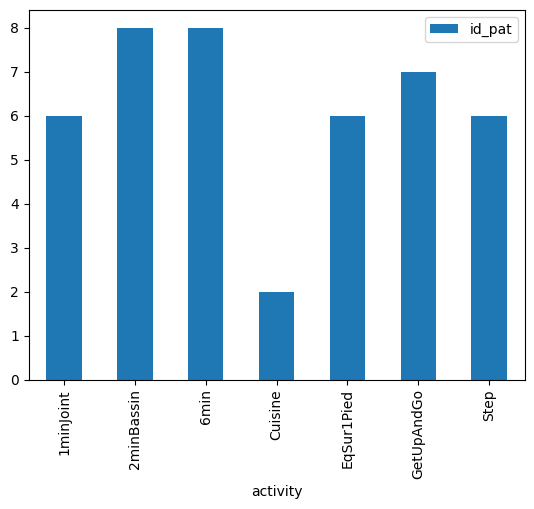

In [ ]:
pd.DataFrame(df.groupby('activity')['id_pat'].nunique()).plot.bar() #nb de fois chaque act est faite

In [ ]:
import plotly.express as px

In [ ]:
df_groupe1 = pd.DataFrame(df.groupby('id_pat')['activity'].nunique()).reset_index()  #nb d'act faite par pat

fig = px.bar(df_groupe1, x='activity', y='id_pat', title='Number of Unique Patients by Activity')
fig.show()

In [ ]:
df_groupe2 = pd.DataFrame(df.groupby('activity')['id_pat'].nunique()).reset_index()  #nb de fois chaque act est faite

fig = px.bar(df_groupe1, x='id_pat', y='activity', title='Number of activities done')
fig.show()